In [1]:
import pandas as pd
import numpy as np
import re
from collections import defaultdict, OrderedDict
from gensim import corpora
from gensim import similarities
from string import punctuation
import gensim
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel, LdaModel, LsiModel, HdpModel
import spacy
# you need to run python -m spacy download en
import nltk
from nltk import RegexpTokenizer, word_tokenize, sent_tokenize
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
import warnings, sys, os, traceback, logging
import seaborn as sns
from pathlib import Path
import matplotlib.pyplot as plt
from wordcloud import WordCloud, ImageColorGenerator
from PIL import Image
import datetime



path = Path(os.getcwd())
sys.path.append(str(path.parent))
warnings.filterwarnings('ignore')  
%matplotlib inline
data_directory = '../data'


In [2]:
FORMAT = '%(asctime)-15s - %(filename)s:%(lineno)s - %(funcName)20s() \n%(message)s \n%(extra)s'
logging.basicConfig(filename='./topic_modelling_eda.log', filemode='w', level=logging.ERROR, format=FORMAT)
logger = logging.getLogger(__name__)

In [3]:
nltk.download('stopwords')
stop_words = stopwords.words('english')

[nltk_data] Downloading package stopwords to /home/zero/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
summary = pd.read_csv(f'{data_directory}/dreamers_summary.csv', sep='|')

In [5]:
dream = pd.read_csv(f'{data_directory}/dreams_clean.csv', sep=';')
# Borro aquellos sueños que no tienen palabras y aquellos en aleman que son los del grupo con id 18, 26 y 27
dream = dream.dropna(axis=0, subset=['words']).drop(dream.loc[dream['group_id'].isin([18, 26, 27, 79, 80])].index)


In [6]:
df = pd.merge(dream, summary, left_on='group_id', right_on='id')
df.head(2) # Imprimo las primeras rows del df mergeado.

,code,note,description,words,group_id,group,dreamer sex,dreamer age,dream years,numbers of dreams,summary,id,total_words
0,1,1957,"The one at the Meads's house, where it's bigge...",154.0,1,Alta: a detailed dreamer,female,adult,1985-1997,422,Alta is an adult woman who wrote down her drea...,1,166351.0
1,2,8/11/67,I'm at a family reunion in a large fine house ...,248.0,1,Alta: a detailed dreamer,female,adult,1985-1997,422,Alta is an adult woman who wrote down her drea...,1,166351.0


In [7]:
data = df['description'].values.tolist() # armamos la lista de sueños.

In [8]:
# Convierte una lista de strings que representan fechas en objetos datetime
def convert_to_date(list_of_string_dates):
    '''
    Convierte una lista de strings que representan fechas en objetos datetime.
    Intenta con dos mascaras, en casa de ser necesario agregar otras.
    La lista de salida tiene la misma longitud que la de entrada y las posiciones
    se mantienen. En caso de que una fecha no pueda ser transformada en datetime
    agrega un None a esa posicion
    '''
    masks = ['%m/%d/%Y', '%Y-%m-%d']
    parsed_dates = []
    for a_date in list_of_string_dates:
        can_parse = False
        for a_mask in masks:
            try:
                parsed_date = datetime.datetime.strptime(a_date, a_mask)
                parsed_dates.append(parsed_date)
                can_parse = True
                break
            except:
                pass
        if not can_parse:
            parsed_dates.append(None)
            logger.error('%sDate cannot be parsed `%s`', traceback.format_exc(), a_date)
    return parsed_dates

In [9]:
# Todas las palabras del corpus eliminando solamente signos de puntuación.
data_words_uncleaned = []
for sentence in data:
    data_words_uncleaned.append([word for word in gensim.utils.simple_preprocess(str(sentence), min_len=1, deacc=True)])

# Solo palabras en minuscula sin signos de puntuación. 
# Se eliminan stopwords y los tokens con menos de 4 caracteres.
def sent_to_words(sentences):
    for sentence in sentences:
        yield([word for word in gensim.utils.simple_preprocess(str(sentence), deacc=True) if word not in stop_words and len(word) > 3])  # deacc=True removes punctuations
data_words = list(sent_to_words(data))
print("El corpus tiene ",len(data_words), " sueños y ",sum([len(x) for x in data_words])," tokens"   )

El corpus tiene  36202  sueños y  2278397  tokens


# Graficos sobre los topicos

In [10]:
lda_model = LdaModel.load(f"{data_directory}/topic_modelling/modelo/lda_topics_25_exp_3")

In [11]:
data_lda = {i: OrderedDict(lda_model.show_topic(i,10)) for i in range(25)}
df_lda = pd.DataFrame(data_lda)
df_lda = df_lda.fillna(0).T
print(df_lda.shape)

(25, 165)


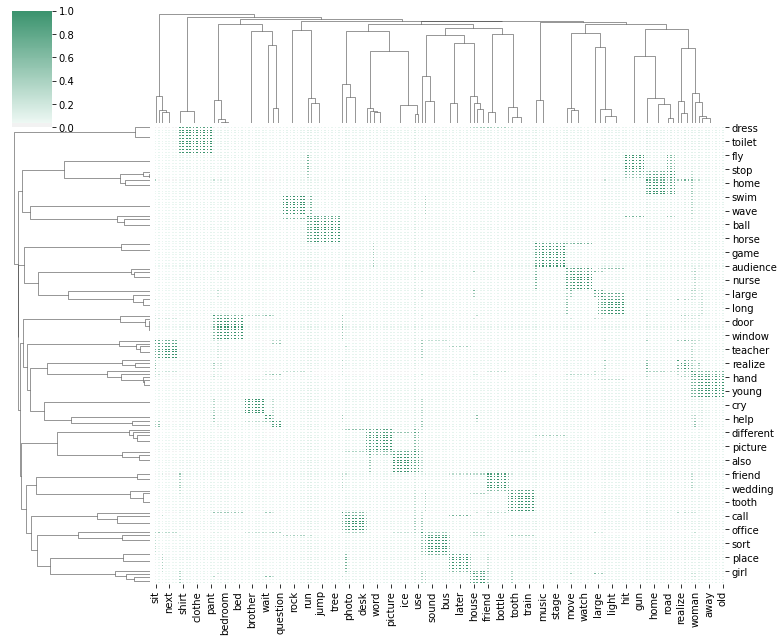

In [12]:
corr = df_lda.corr()
cmap = sns.diverging_palette(275, 150, s=80, l=55, as_cmap=True)
graphic = sns.clustermap(corr, center=0, standard_scale=1, cmap=cmap, metric='cosine', linewidths=.75, figsize=(11, 9))
plt.show()

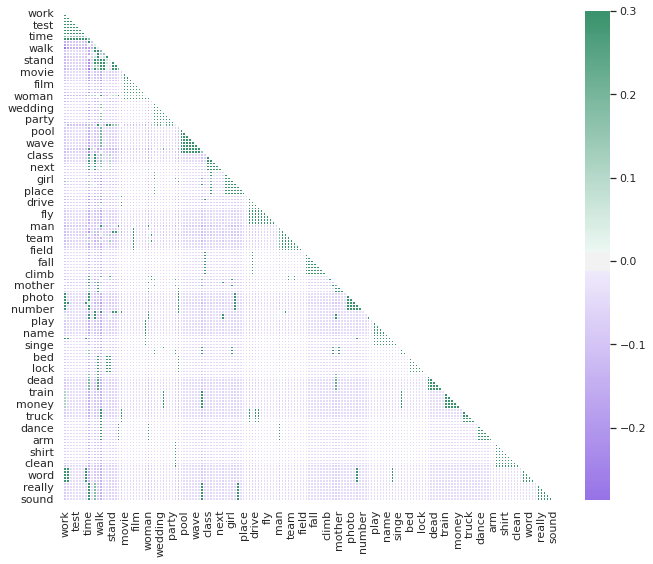

In [13]:
sns.set(style="white")
mask = np.triu(np.ones_like(corr, dtype=np.bool))
f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, linewidths=.5)
plt.show()

## Graficos sobre la frecuencia de las palabras

In [14]:
def most_frequent_words(bag_of_words, topn=None):
    df = pd.DataFrame(
        list(zip([item for sublist in bag_of_words for item in sublist], [1] * len(data_words_uncleaned))), columns=['words', 'count'])
    df=df.groupby(['words']).count()
    if topn is None:
        return df.sort_values(by="count",ascending=False).reset_index()
    
    return df.sort_values(by="count",ascending=False).head(topn).reset_index()

In [15]:
top_words_freq = 30
uncleaned_freq = most_frequent_words(data_words_uncleaned, top_words_freq)
cleaned_freq = most_frequent_words(data_words, top_words_freq)

In [88]:
uncleaned_freq

,words,count
0,i,2009
1,and,1371
2,the,1297
3,a,1117
4,to,1089
5,it,828
6,s,739
7,of,631
8,in,499
9,m,481


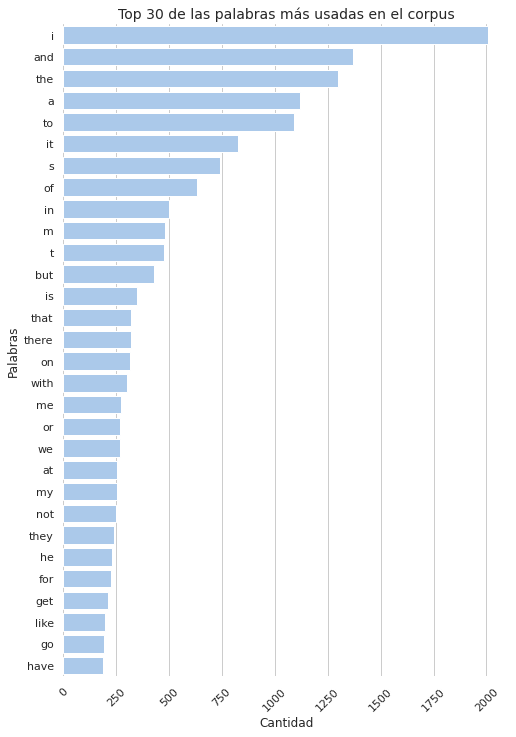

In [85]:
f, ax = plt.subplots(figsize=(8, 12))
sns.set(style="whitegrid")
sns.set_color_codes("pastel")
plot = sns.barplot(y="words", x="count", data=uncleaned_freq, label="Frecuencia", color="b")
ax.set(ylabel="Palabras", xlabel="Cantidad")
ax.set_title(f"Top {top_words_freq} de las palabras más usadas en el corpus", fontsize=14)
for item in plot.get_xticklabels():
    item.set_rotation(45)
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/frequent_words.png")

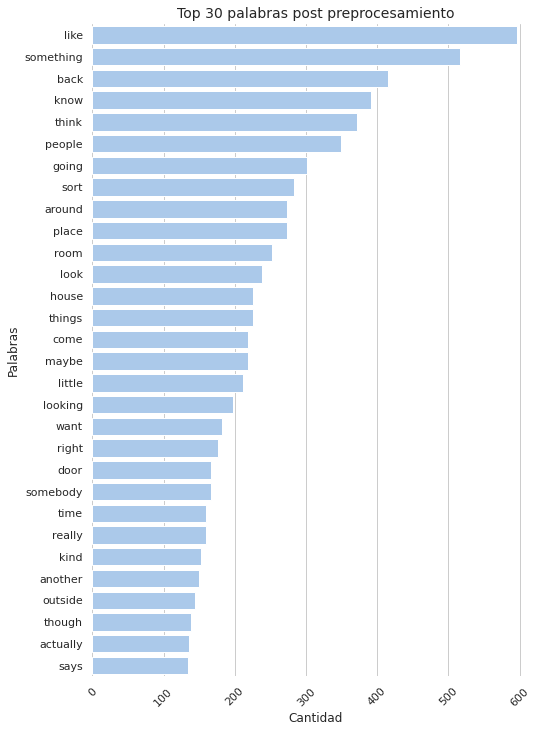

In [86]:
f, ax = plt.subplots(figsize=(8, 12))
sns.set(style="whitegrid")
sns.set_color_codes("pastel")
plot = sns.barplot(y="words", x="count", data=cleaned_freq, label="Frecuencia", color="b")
ax.set(ylabel="Palabras", xlabel="Cantidad")
ax.set_title(f"Top {top_words_freq} palabras post preprocesamiento", fontsize=14)
for item in plot.get_xticklabels():
    item.set_rotation(45)
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/frequent_clean_words.png")

In [18]:
mask = np.array(Image.open(f"{data_directory}/topic_modelling/dream.jpg"))
image_colors = ImageColorGenerator(mask)

In [19]:
# Palabras previas al filtrado
long_string = ','.join([item for sublist in data_words_uncleaned for item in sublist])# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue', mask=mask)# Generate a word cloud
wordcloud.generate(long_string)# Visualize the word cloud
wordcloud.to_image()
wordcloud.to_file(f"{data_directory}/topic_modelling/words_raw.png")

In [20]:
# Palabras despues del filtrado
long_string = ','.join([item for sublist in data_words for item in sublist])# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue', mask=mask)# Generate a word cloud
wordcloud.generate(long_string)# Visualize the word cloud
wordcloud.to_image()
wordcloud.to_file(f"{data_directory}/topic_modelling/words_after_filter.png")

In [21]:
topic_words = []
for k, v in data_lda.items():
    for k1, v1 in v.items():
        topic_words.append(k1)

df_topic_words = pd.DataFrame({'words': topic_words, 'count': [1] * len(topic_words)}).groupby('words').agg({'count':'sum'}).sort_values(by="count",ascending=False).reset_index()


In [22]:
# Palabras del topico
long_string = ','.join(topic_words)
wordcloud = WordCloud(background_color="white", max_words=len(topic_words), contour_width=3, contour_color='steelblue', mask=mask)# Generate a word cloud
wordcloud.generate(long_string)# Visualize the word cloud
wordcloud.to_image()
wordcloud.to_file(f"{data_directory}/topic_modelling/words_topics.png")


## Gráficos sobre Phil y Vet

In [23]:
df_extended = pd.read_csv(f"{data_directory}/topic_modelling/lda_topic_example_25_exp_3.csv", sep=";")
df_vietnam = df_extended.loc[df_extended['group'].isin(['Vietnam Vet: 1970-2008 war dreams', 'Vietnam Vet: 2015 dreams', 'Vietnam Vet: 2016-17 dreams'])]
df_vietnam['dream_date'] = convert_to_date(list(df_vietnam.note))

df_phil = df_extended.loc[df_extended['group'].isin(['Phil 1: teens', 'Phil 2: late 20s', 'Phil 3: retirement'])]
df_phil['dream_date'] = convert_to_date(list(df_phil.note))

In [24]:
viet_by_topic = df_vietnam.groupby('Dominant_Topic')['Dominant_Topic'].agg('count')
viet_by_topic.index.rename('Vietnam', inplace=True)
viet_by_topic.name = 'Vietnam'
phil_by_topic = df_phil.groupby('Dominant_Topic')['Dominant_Topic'].agg('count')
phil_by_topic.index.rename('Phil', inplace=True)
phil_by_topic.name = 'Phil'

In [115]:
viet_by_topic = df_vietnam.groupby(['Dominant_Topic'], as_index=False).agg({'Perc_Contribution': 'sum'})
viet_by_topic['Perc_Contribution'] = viet_by_topic['Perc_Contribution'] / df_vietnam['Perc_Contribution'].sum()
viet_by_topic['Soñador'] = 'Vietnam'

phil_by_topic = df_phil.groupby(['Dominant_Topic'], as_index=False).agg({'Perc_Contribution': 'sum'})
phil_by_topic['Perc_Contribution'] = phil_by_topic['Perc_Contribution'] / df_phil['Perc_Contribution'].sum()
phil_by_topic['Soñador'] = 'Phil'


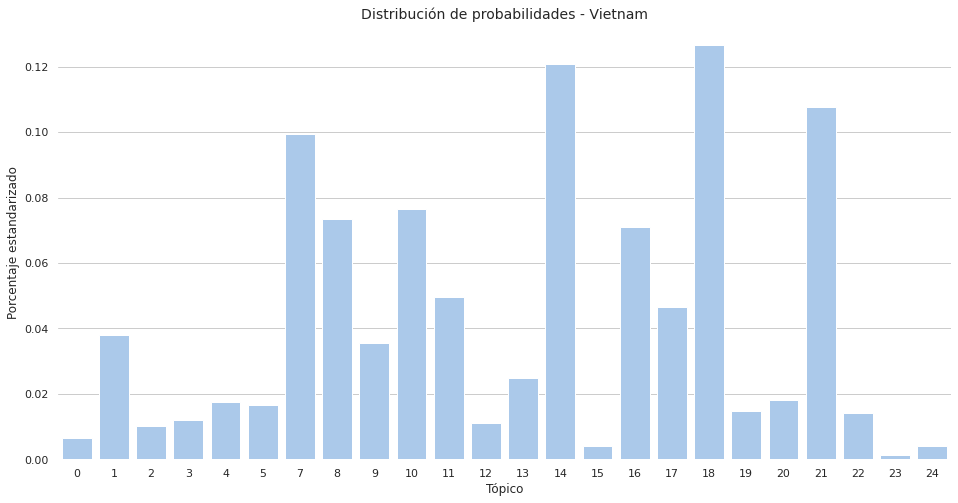

In [106]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.set_color_codes("pastel")
sns.barplot(x='Dominant_Topic', y='Perc_Contribution', data=viet_by_topic, color='b')
ax.set(ylabel="Porcentaje estandarizado", xlabel="Tópico")
ax.set_title("Distribución de probabilidades - Vietnam", fontsize=14)
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/topics_vietnam.png")

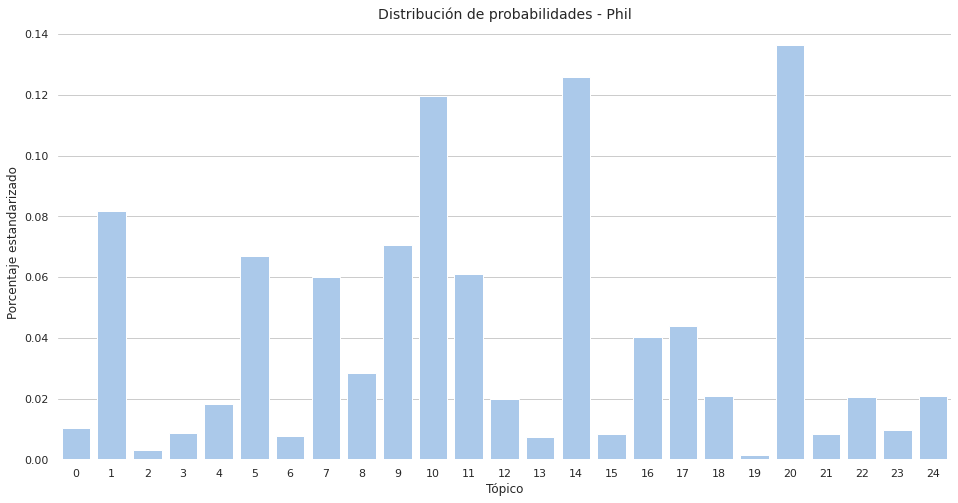

In [108]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.set_color_codes("pastel")
sns.barplot(x='Dominant_Topic', y='Perc_Contribution', data=phil_by_topic, color='b')
ax.set(ylabel="Porcentaje estandarizado", xlabel="Tópico")
ax.set_title("Distribución de probabilidades - Phil", fontsize=14)
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/topics_phil.png")

In [116]:
tidy_phil_viet = pd.concat([phil_by_topic, viet_by_topic], axis=0).fillna(0)

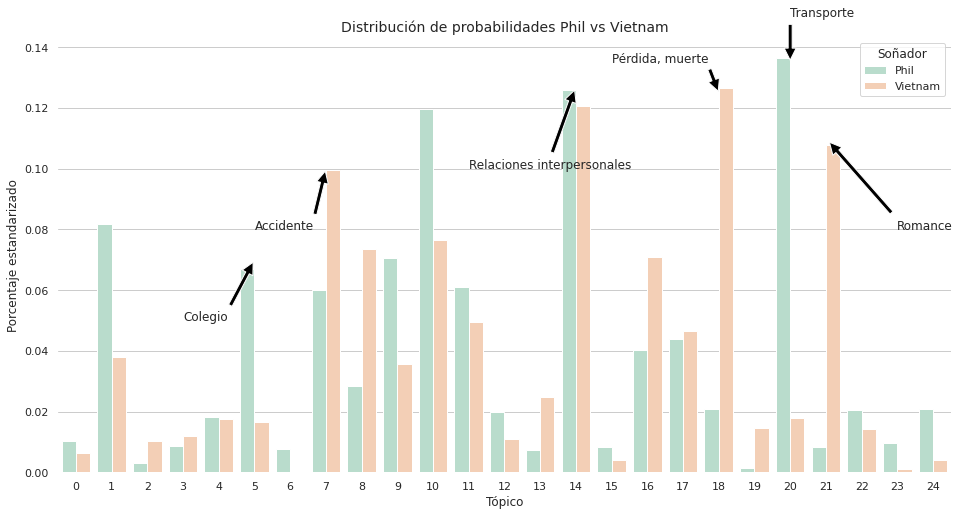

In [223]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.barplot(x='Dominant_Topic', y='Perc_Contribution', hue='Soñador', data=tidy_phil_viet, palette="Pastel2")
ax.set(ylabel="Porcentaje estandarizado", xlabel="Tópico")
ax.set_title("Distribución de probabilidades Phil vs Vietnam", fontsize=14)
ax.annotate('Pérdida, muerte', xy=(18, 0.125), xytext=(15, 0.135), arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate('Accidente', xy=(7, 0.1), xytext=(5, 0.08), arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate('Relaciones interpersonales', xy=(14, 0.127), xytext=(11, 0.1), arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate('Transporte', xy=(20, 0.135), xytext=(20, 0.15), arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate('Romance', xy=(21, 0.11), xytext=(23, 0.08), arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate('Colegio', xy=(5, 0.07), xytext=(3, 0.05), arrowprops=dict(facecolor='black', shrink=0.05))
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/topics_phil_viet.png")

In [142]:
viet_by_topic_year = df_vietnam.groupby(['Dominant_Topic', 'dream years'], as_index=False).agg({'Perc_Contribution': 'sum'})
viet_by_topic_year.rename(columns={'dream years': 'Período'}, inplace=True)

phil_by_topic_year = df_phil.groupby(['Dominant_Topic', 'dream years'], as_index=False).agg({'Perc_Contribution': 'sum'})
phil_by_topic_year.rename(columns={'dream years': 'Período'}, inplace=True)

for a_period in viet_by_topic_year['Período'].unique():
    sum_by_period = sum(df_vietnam.loc[df_vietnam['dream years'] == a_period]['Perc_Contribution'])
    vector_loc = viet_by_topic_year.loc[viet_by_topic_year['Período'] == a_period].index
    viet_by_topic_year.iloc[vector_loc, viet_by_topic_year.columns.get_loc('Perc_Contribution')] = viet_by_topic_year['Perc_Contribution'] / sum_by_period

for a_period in phil_by_topic_year['Período'].unique():
    sum_by_period = sum(df_phil.loc[df_phil['dream years'] == a_period]['Perc_Contribution'])
    vector_loc = phil_by_topic_year.loc[phil_by_topic_year['Período'] == a_period].index
    phil_by_topic_year.iloc[vector_loc, phil_by_topic_year.columns.get_loc('Perc_Contribution')] = phil_by_topic_year['Perc_Contribution'] / sum_by_period

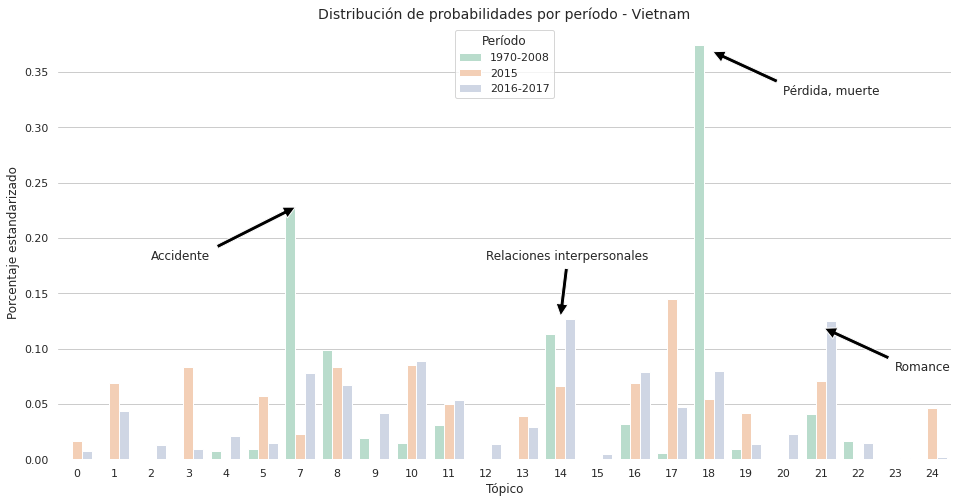

In [204]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.barplot(x='Dominant_Topic', y='Perc_Contribution', data=viet_by_topic_year, hue='Período', hue_order=['1970-2008', '2015', '2016-2017'], palette="Pastel2")
ax.set(ylabel="Porcentaje estandarizado", xlabel="Tópico")
ax.set_title("Distribución de probabilidades por período - Vietnam", fontsize=14)
ax.annotate('Pérdida, muerte', xy=(17, 0.37), xytext=(19, 0.33), arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate('Accidente', xy=(6, 0.23), xytext=(2, 0.18), arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate('Relaciones interpersonales', xy=(13, 0.127), xytext=(11, 0.18), arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate('Romance', xy=(20, 0.12), xytext=(22, 0.08), arrowprops=dict(facecolor='black', shrink=0.05))
#ax.annotate('Accidente', xy=(6, 0.23), xytext=(8, 0.23), arrowprops=dict(facecolor='black', shrink=0.05))
#ax.annotate('Dormitorio', xy=(16, 0.14), xytext=(13, 0.17), arrowprops=dict(facecolor='black', shrink=0.05))
#ax.annotate('Fiesta, casamiento', xy=(3, 0.08), xytext=(0, 0.15), arrowprops=dict(facecolor='black', shrink=0.05))
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/topics_viet_year.png")

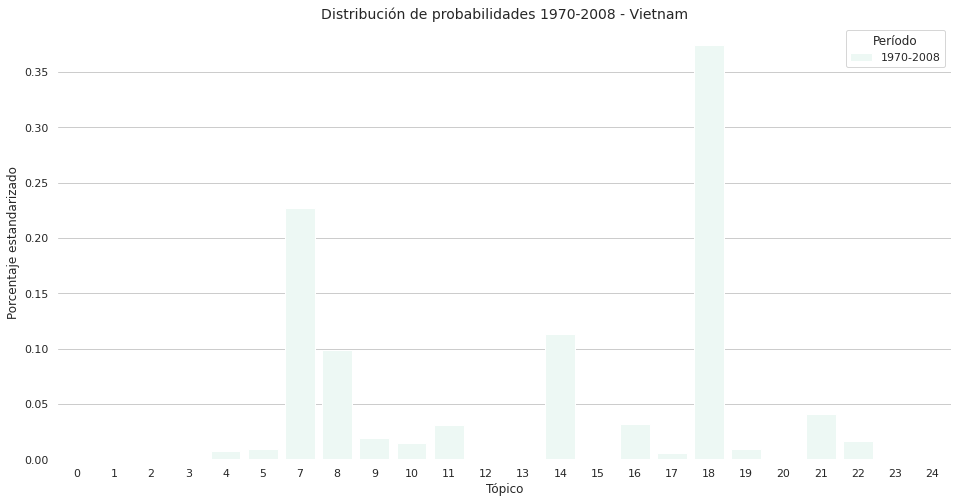

In [220]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.barplot(x='Dominant_Topic', y='Perc_Contribution', data=viet_by_topic_year, hue='Período', hue_order=['1970-2008'], color='#B5EAD7')
ax.set(ylabel="Porcentaje estandarizado", xlabel="Tópico")
ax.set_title("Distribución de probabilidades 1970-2008 - Vietnam", fontsize=14)
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/topics_viet_year-1.png")

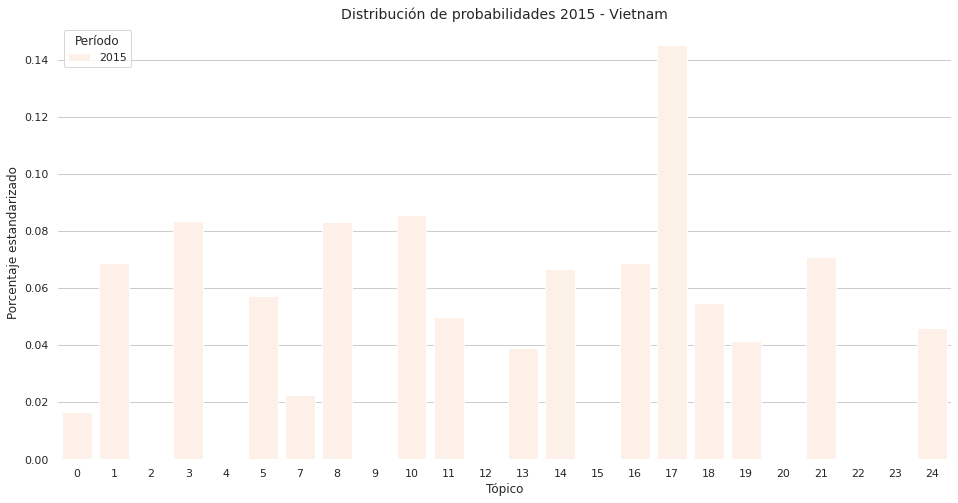

In [222]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.barplot(x='Dominant_Topic', y='Perc_Contribution', data=viet_by_topic_year, hue='Período', hue_order=['2015'], color='#FFDAC1')
ax.set(ylabel="Porcentaje estandarizado", xlabel="Tópico")
ax.set_title("Distribución de probabilidades 2015 - Vietnam", fontsize=14)
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/topics_viet_year-2.png")

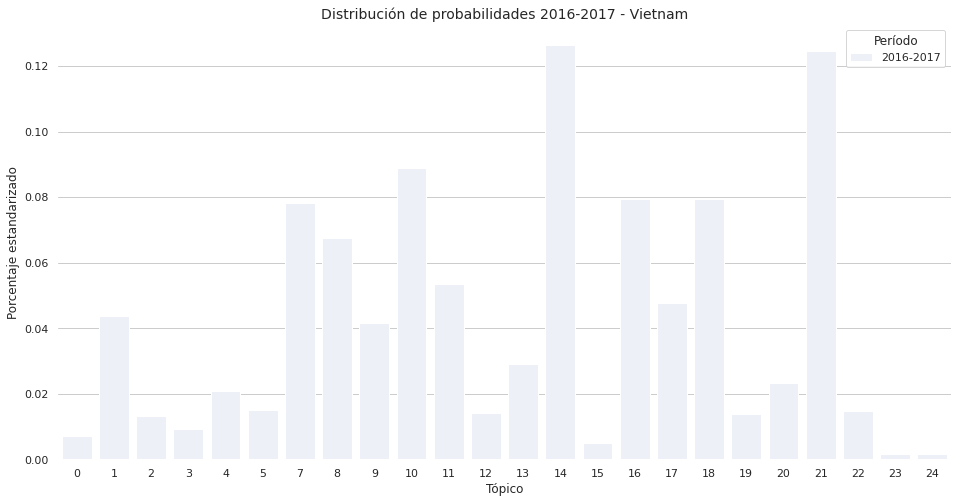

In [218]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.barplot(x='Dominant_Topic', y='Perc_Contribution', data=viet_by_topic_year, hue='Período', hue_order=['2016-2017'], color="#C7CEEA")
ax.set(ylabel="Porcentaje estandarizado", xlabel="Tópico")
ax.set_title("Distribución de probabilidades 2016-2017 - Vietnam", fontsize=14)
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/topics_viet_year-3.png")

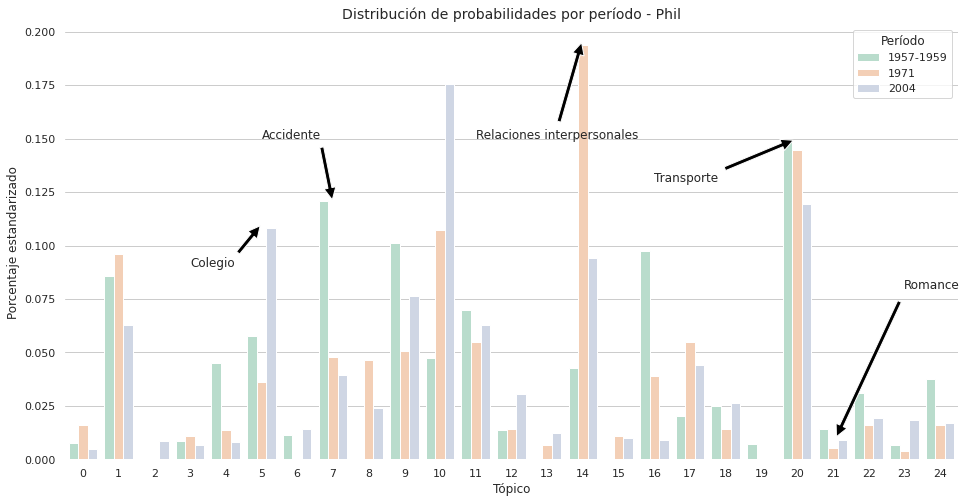

In [224]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.barplot(x='Dominant_Topic', y='Perc_Contribution', data=phil_by_topic_year, hue='Período', hue_order=['1957-1959', '1971', '2004'], palette="Pastel2")
ax.set(ylabel="Porcentaje estandarizado", xlabel="Tópico")
ax.set_title("Distribución de probabilidades por período - Phil", fontsize=14)
ax.annotate('Colegio', xy=(5, 0.11), xytext=(3, 0.09), arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate('Romance', xy=(21, 0.007), xytext=(23, 0.08), arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate('Transporte', xy=(20, 0.15), xytext=(16, 0.13), arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate('Accidente', xy=(7, 0.12), xytext=(5, 0.15), arrowprops=dict(facecolor='black', shrink=0.05))
ax.annotate('Relaciones interpersonales', xy=(14, 0.197), xytext=(11, 0.15), arrowprops=dict(facecolor='black', shrink=0.05))
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/topics_phil_year.png")

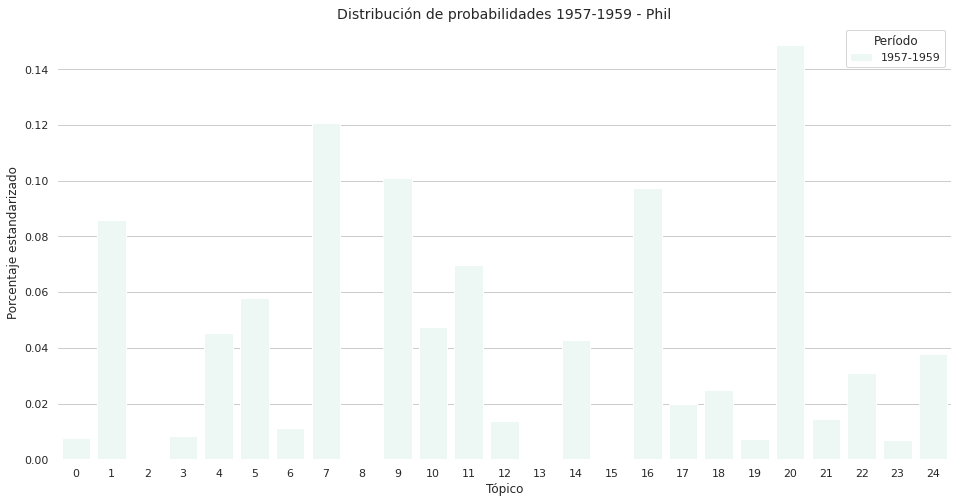

In [225]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.barplot(x='Dominant_Topic', y='Perc_Contribution', data=phil_by_topic_year, hue='Período', hue_order=['1957-1959'], color='#B5EAD7')
ax.set(ylabel="Porcentaje estandarizado", xlabel="Tópico")
ax.set_title("Distribución de probabilidades 1957-1959 - Phil", fontsize=14)
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/topics_phil_year-1.png")

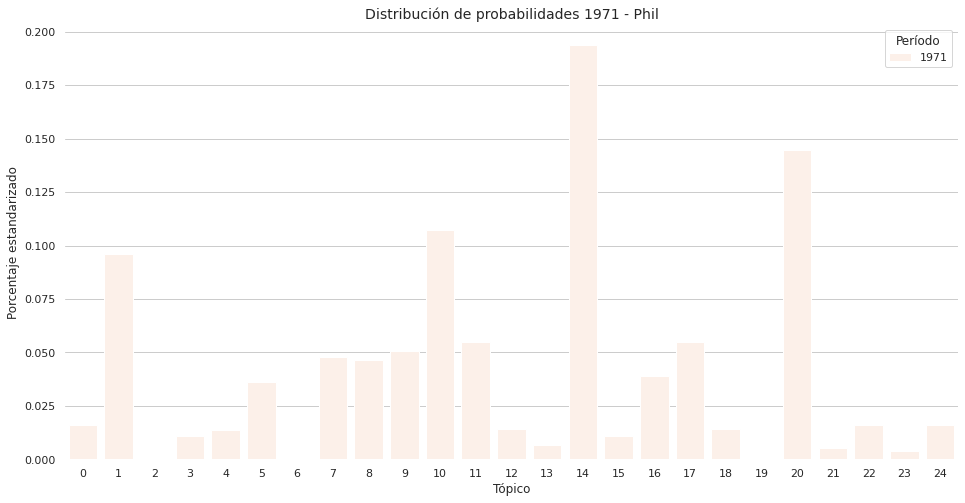

In [226]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.barplot(x='Dominant_Topic', y='Perc_Contribution', data=phil_by_topic_year, hue='Período', hue_order=['1971'], color='#FFDAC1')
ax.set(ylabel="Porcentaje estandarizado", xlabel="Tópico")
ax.set_title("Distribución de probabilidades 1971 - Phil", fontsize=14)
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/topics_phil_year-2.png")

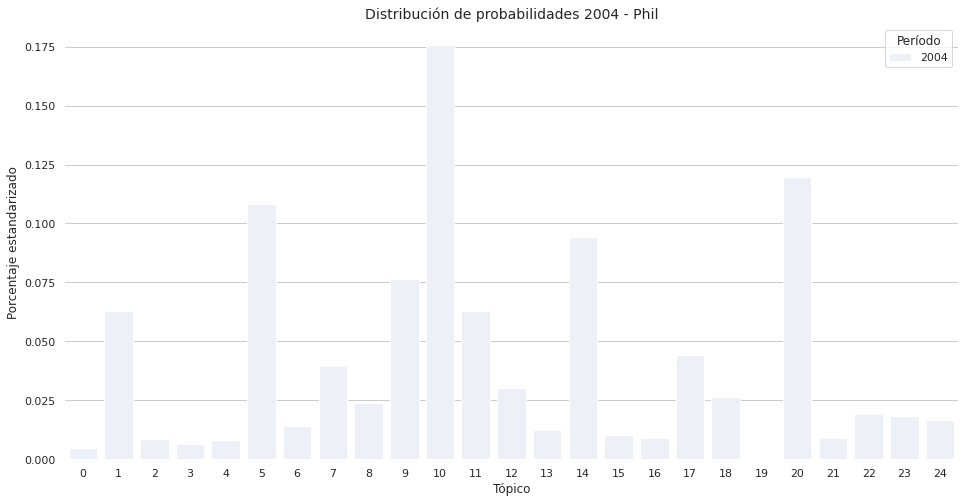

In [227]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.barplot(x='Dominant_Topic', y='Perc_Contribution', data=phil_by_topic_year, hue='Período', hue_order=['2004'], color="#C7CEEA")
ax.set(ylabel="Porcentaje estandarizado", xlabel="Tópico")
ax.set_title("Distribución de probabilidades 2004 - Phil", fontsize=14)
sns.despine(left=True, bottom=True)
plt.savefig(f"{data_directory}/topic_modelling/topics_phil_year-3.png")

In [161]:
df_series_vietnam = df_vietnam.set_index('dream_date')['Dominant_Topic']
df_series_phil = df_phil.set_index('dream_date')['Dominant_Topic']

In [162]:
df_vietnam['row_count'] = np.arange(len(df_vietnam)) + 1
df_phil['row_count'] = np.arange(len(df_phil)) + 1

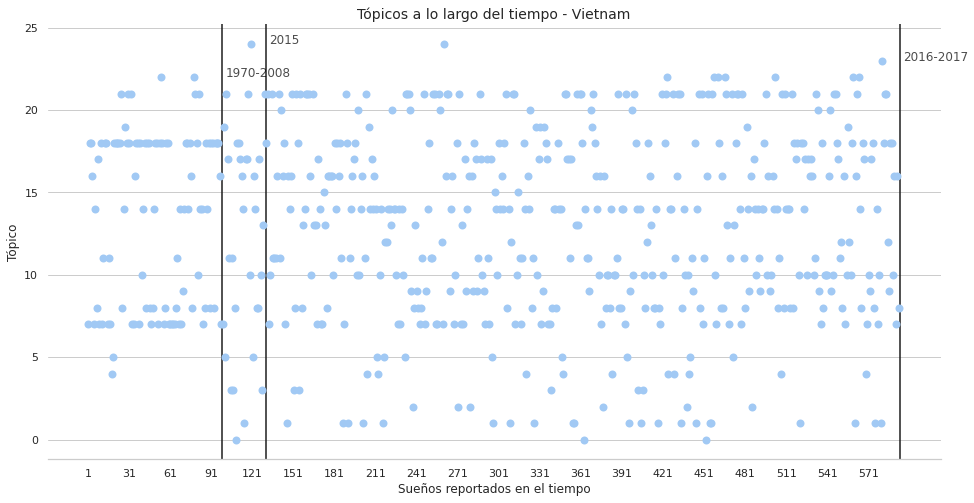

In [163]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.set_color_codes("pastel")
plot = sns.stripplot(y='Dominant_Topic', x='row_count', data=df_vietnam, size=8, color='b', edgecolor="gray")
for ind, label in enumerate(plot.get_xticklabels()):
    if ind % 30 == 0:
        label.set_visible(True)
    else:
        label.set_visible(False)
xposition = [(98, 22, "1970-2008"), (130, 24, "2015"), (593, 23, "2016-2017")]
for posx, posy, text in xposition:
    ax.axvline(x=posx, color='k', linestyle='-')
    ax.text(x=posx + 2, y=posy, s=text, alpha=0.7, color='black')
ax.set_title("Tópicos a lo largo del tiempo - Vietnam", fontsize=14)
ax.set(ylabel="Tópico", xlabel="Sueños reportados en el tiempo")
sns.despine(left=True, bottom=False)
plt.savefig(f"{data_directory}/topic_modelling/topics_viet_in_time.png")

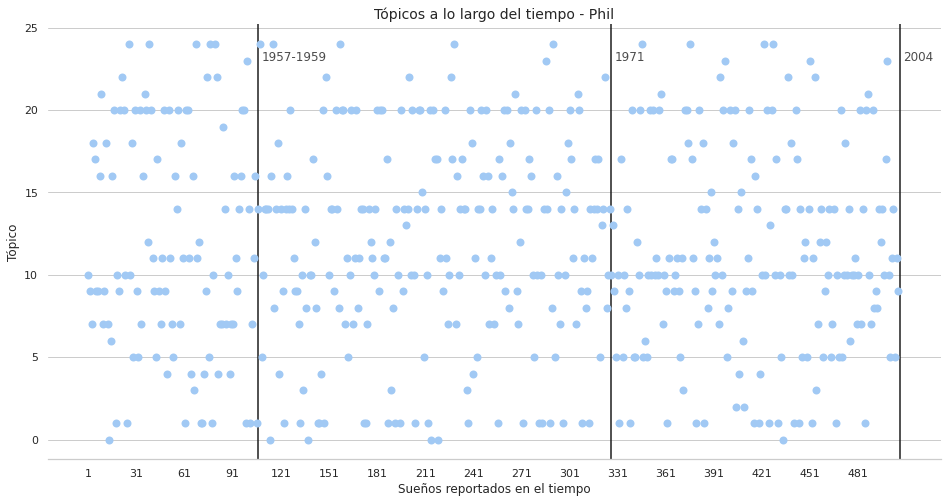

In [37]:
f, ax = plt.subplots(figsize=(16, 8))
sns.set(style="whitegrid")
sns.set_color_codes("pastel")
plot = sns.stripplot(y='Dominant_Topic', x='row_count', data=df_phil, size=8, color='b', edgecolor="gray")
for ind, label in enumerate(plot.get_xticklabels()):
    if ind % 30 == 0:
        label.set_visible(True)
    else:
        label.set_visible(False)
xposition = [(106, 23, "1957-1959"), (326, 23, "1971"), (506, 23, "2004")]
for posx, posy, text in xposition:
    ax.axvline(x=posx, color='k', linestyle='-')
    ax.text(x=posx + 2, y=posy, s=text, alpha=0.7, color='black')
ax.set_title("Tópicos a lo largo del tiempo - Phil", fontsize=14)
ax.set(ylabel="Tópico", xlabel="Sueños reportados en el tiempo")
sns.despine(left=True, bottom=False)
plt.savefig(f"{data_directory}/topic_modelling/topics_phil_in_time.png")